In [28]:
# Installations:
!pip install opencv-python

^C


## Setting up custom class

In [38]:
import os
import numpy as np
from PIL import Image
import torch
from torch.utils.data import Dataset, DataLoader

import glob
import os
import matplotlib.pyplot as plt
import cv2
import numpy as np
import rasterio
import timeit
import time

In [39]:
class PixelClassificationDataset(Dataset):
    def __init__(self, feature_folder, label_folder):
        self.feature_folder = feature_folder
        self.label_folder = label_folder
        self.feature_files = [f for f in os.listdir(feature_folder) if f.endswith(('.tif'))]
        self.label_files = [f for f in os.listdir(label_folder) if f.endswith(('.png'))]

    def __len__(self):
        return len(self.feature_files)

    def __getitem__(self, idx):
        # Load feature image using PIL
        feature_file = self.feature_files[idx]
        feature_path = os.path.join(self.feature_folder, feature_file)
        feature_img = rasterio.open(feature_path).read()
        feature_array = np.array(feature_img).transpose(1,2,0) # Convert feature image to numpy array and change the order of the dimensions to 512x512x6

        # Load corresponding label image using PIL
        label_file = self.label_files[idx]
        label_path = os.path.join(self.label_folder, label_file)
        label_img = Image.open(label_path)
        label_array = np.array(label_img)  # Convert label image to numpy array

        # Convert to PyTorch tensors
        feature_tensor = torch.from_numpy(feature_array).float()
        label_tensor = torch.from_numpy(label_array).float()

        return feature_tensor, label_tensor

In [40]:
# Example usage
feature_folder ="C:\\Users\\User\\OneDrive - Université Bretagne Sud\\Workshop\\Track1\\Track1\\train\\images\\"
label_folder = "C:\\Users\\User\\OneDrive - Université Bretagne Sud\\Workshop\\Track1\\Track1\\train\\labels\\"
batch_size = 32

dataset = PixelClassificationDataset(feature_folder, label_folder)
data_loader = DataLoader(dataset, batch_size=batch_size, shuffle=True)

In [49]:
import matplotlib.patches as mpatches

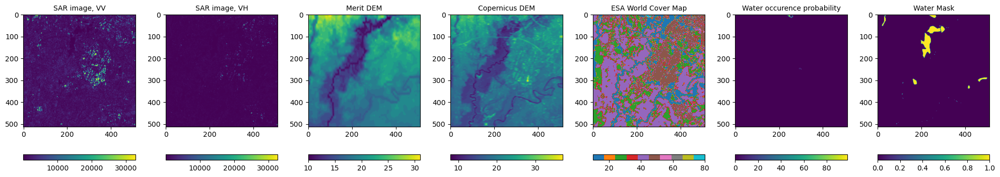

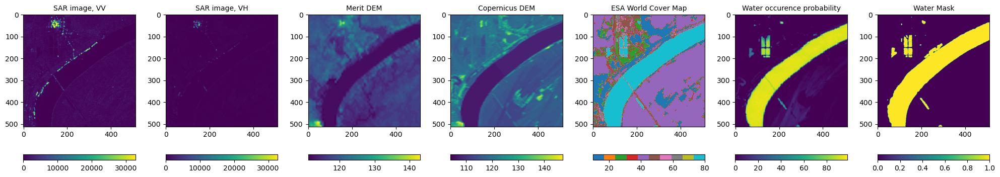

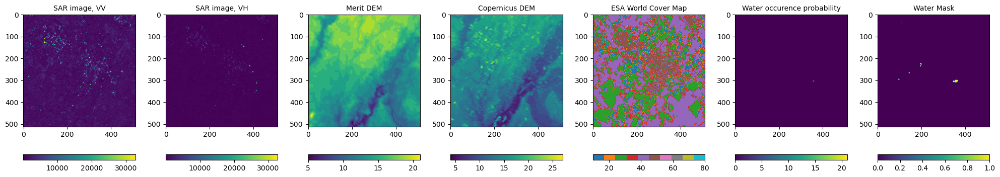

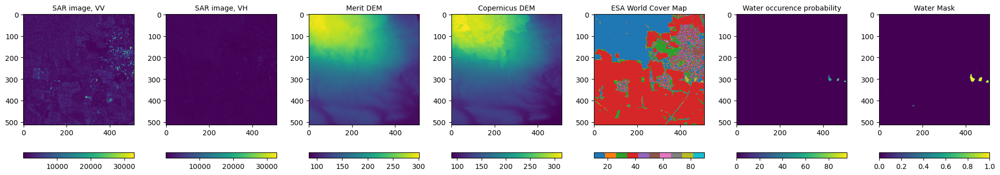

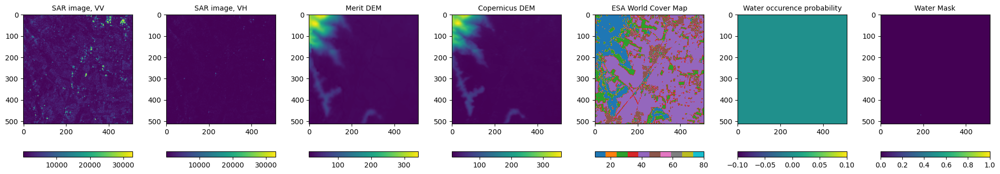

...

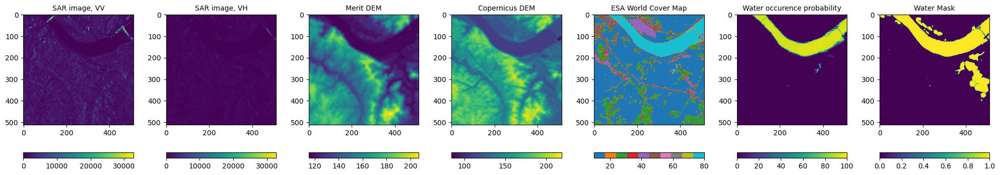

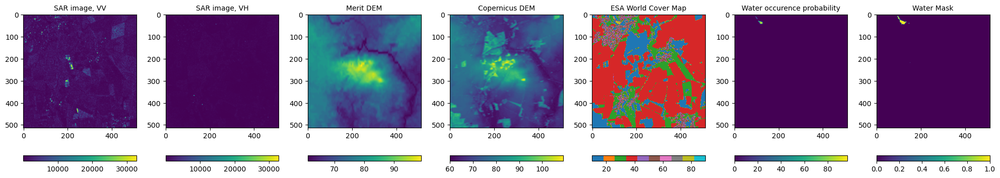

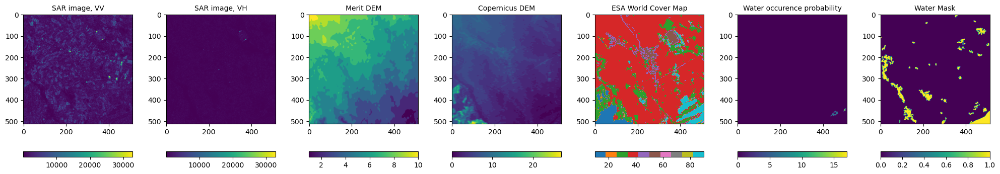

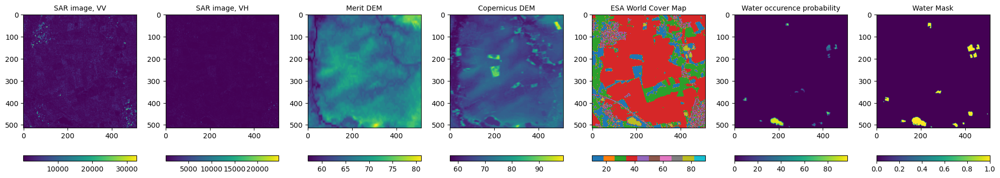

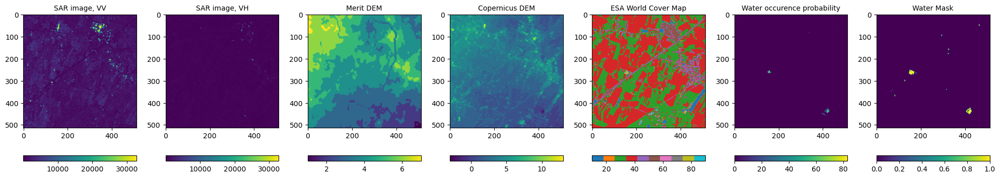

244.9515678882599


In [61]:
# Visualise
# Iterate through batches
start = time.time()
for batch in data_loader:
    features, labels = batch

    # plot feature and label images
    fig, axes = plt.subplots(1, 7, figsize=(20, 4))

    # randomly choose an image,label set to display
    idx = np.random.choice(batch_size)
    feature_names = ['SAR image, VV', 'SAR image, VH', 'Merit DEM', 'Copernicus DEM', 
                     'ESA World Cover Map','Water occurence probability']
    for i in range(6):
        if i ==4: # for the ESA World Cover Map, we use a random colormap
            im =axes[i].imshow(features[idx][:,:,i], cmap='tab10')
            axes[i].set_title(feature_names[i], fontsize=10)
            # add colorbar
            sm = plt.cm.ScalarMappable(cmap='tab10')
            sm.set_array(features[idx][:, :, i])
            cbar = fig.colorbar(im, ax=axes[i], orientation = 'horizontal') 
        
        else:
            #print(i)
            im =axes[i].imshow(features[idx][:,:,i], cmap='viridis')
            axes[i].set_title(feature_names[i], fontsize=10)
            sm = plt.cm.ScalarMappable(cmap='viridis')
            sm.set_array(features[idx][:, :, i])
            cbar = fig.colorbar(im, ax=axes[i], orientation = 'horizontal')

    im2=axes[6].imshow(labels[idx], cmap='viridis')
    axes[6].set_title('Water Mask', fontsize=10)
    sm = plt.cm.ScalarMappable(cmap='viridis')
    sm.set_array(np.int32(labels[idx]))
    cbar = fig.colorbar(im2, ax=axes[6], orientation = 'horizontal')

    plt.tight_layout()
    plt.show()
    #plt.imshow(features[0][:,:,0], cmap='gray')
end = time.time()
print(end - start)

In [63]:
len(dataset)

1631

In [71]:
# Descriptive
# Iterate through batches
start = time.time()
max_vv_0 = 0
max_vh_0 = 0
max_merit_dem_0 = 0
max_cop_dem_0 = 0

sum_vv_0 = 0
sum_vh_0 = 0
sum_merit_dem_0 = 0
sum_cop_dem_0 = 0

min_vv_0 = 0
min_vh_0 = 0
min_merit_dem_0 = 0
min_cop_dem_0 = 0

# above values for label 1 as well:
max_vv_1 = 0
max_vh_1 = 0
max_merit_dem_1 = 0
max_cop_dem_1 = 0

sum_vv_1 = 0
sum_vh_1 = 0
sum_merit_dem_1 = 0
sum_cop_dem_1 = 0

min_vv_1 = 0
min_vh_1 = 0
min_merit_dem_1 = 0
min_cop_dem_1 = 0

for batch in data_loader:
    features, labels = batch

    # reshape features and labels to flatten image dimensions 
    features_2d = features.view(-1, 6)
    labels_1d = labels.view(-1)

    features_2d_0 = features_2d[labels_1d == 0]
    features_2d_1 = features_2d[labels_1d == 1]

    # update descriptive stats variables initiated above
    
    if torch.max(features_2d_0[:,0]) > max_vv_0:
        max_vv_0 = torch.max(features_2d_0[:,0])
    if torch.max(features_2d_0[:,1]) > max_vh_0:
        max_vh_0 = torch.max(features_2d_0[:,1])
    if torch.max(features_2d_0[:,2]) > max_merit_dem_0:
        max_merit_dem_0 = torch.max(features_2d_0[:,2])
    if torch.max(features_2d_0[:,3]) > max_cop_dem_0:
        max_cop_dem_0 = torch.max(features_2d_0[:,3])

    if torch.min(features_2d_0[:,0]) < min_vv_0:
        min_vv_0 = torch.min(features_2d_0[:,0])
    if torch.min(features_2d_0[:,1]) < min_vh_0:
        min_vh_0 = torch.min(features_2d_0[:,1])
    if torch.min(features_2d_0[:,2]) < min_merit_dem_0:
        min_merit_dem_0 = torch.min(features_2d_0[:,2])
    if torch.min(features_2d_0[:,3]) < min_cop_dem_0:
        min_cop_dem_0 = torch.min(features_2d_0[:,3])

    sum_vv_0 += torch.sum(features_2d_0[:,0])
    sum_vh_0 += torch.sum(features_2d_0[:,1])
    sum_merit_dem_0 += torch.sum(features_2d_0[:,2])
    sum_cop_dem_0 += torch.sum(features_2d_0[:,3])
end = time.time()
print("Time: ",end - start)

print("Non-water Max VV:" , max_vv_0)
print("Non-water Min VV:" , min_vv_0)
print("Non-water Mean VV:" , sum_vv_0/(len(dataset)*512*512))

print("Non-water Max VH:" , max_vh_0)
print("Non-water Min VH:" , min_vh_0)
print("Non-water Mean VH:" , sum_vh_0/(len(dataset)*512*512))

print("Non-water Max Merit DEM:" , max_merit_dem_0)
print("Non-water Min Merit DEM:" , min_merit_dem_0)
print("Non-water Mean Merit DEM:" , sum_merit_dem_0/(len(dataset)*512*512))

print("Non-water Max Copernicus DEM:" , max_cop_dem_0)
print("Non-water Min Copernicus DEM:" , min_cop_dem_0)
print("Non-water Mean Copernicus DEM:" , sum_cop_dem_0/(len(dataset)*512*512))

# above values for label 1 as well:
print("Water Max VV:" , max_vv_1)
print("Water Min VV:" , min_vv_1)
print("Water Mean VV:" , sum_vv_1/(len(dataset)*512*512))

print("Water Max VH:" , max_vh_1)
print("Water Min VH:" , min_vh_1)
print("Water Mean VH:" , sum_vh_1/(len(dataset)*512*512))

print("Water Max Merit DEM:" , max_merit_dem_1)
print("Water Min Merit DEM:" , min_merit_dem_1)
print("Water Mean Merit DEM:" , sum_merit_dem_1/(len(dataset)*512*512))

print("Water Max Copernicus DEM:" , max_cop_dem_1)
print("Water Min Copernicus DEM:" , min_cop_dem_1)
print("Water Mean Copernicus DEM:" , sum_cop_dem_1/(len(dataset)*512*512))

d:\Programs\anaconda3\Lib\site-packages\rasterio\__init__.py:319: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Time:  122.68433833122253
Non-water Max VV: tensor(32765.)
Non-water Min VV: 0
Non-water Mean VV: tensor(1731.8743)
Non-water Max VH: tensor(32765.)
Non-water Min VH: 0
Non-water Mean VH: tensor(372.7566)
Non-water Max Merit DEM: tensor(3229.)
Non-water Min Merit DEM: tensor(-9999.)
Non-water Mean Merit DEM: tensor(154.2459)
Non-water Max Copernicus DEM: tensor(3202.)
Non-water Min Copernicus DEM: tensor(-33.)
Non-water Mean Copernicus DEM: tensor(156.3727)
Water Max VV: 0
Water Min VV: 0
Water Mean VV: 0.0
Water Max VH: 0
Water Min VH: 0
Water Mean VH: 0.0
Water Max Merit DEM: 0
Water Min Merit DEM: 0
Water Mean Merit DEM: 0.0
Water Max Copernicus DEM: 0
Water Min Copernicus DEM: 0
Water Mean Copernicus DEM: 0.0


KeyboardInterrupt: 

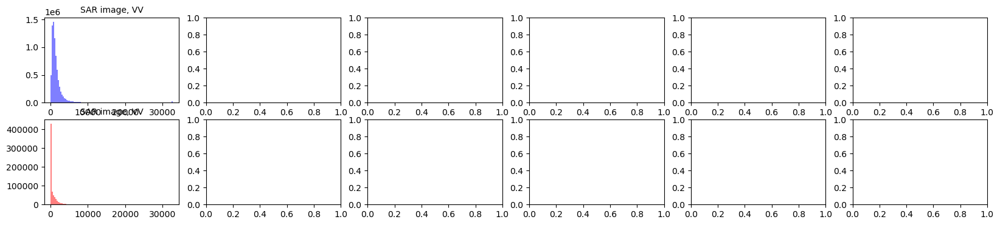

In [74]:
# Use the loop above and now create histograms for each feature for both classes
# Iterate through batches
start = time.time()
for batch in data_loader:
    features, labels = batch

    # reshape features and labels to flatten image dimensions 
    features_2d = features.view(-1, 6)
    labels_1d = labels.view(-1)

    features_2d_0 = features_2d[labels_1d == 0]
    features_2d_1 = features_2d[labels_1d == 1]

    # update descriptive stats variables initiated above
    fig, axes = plt.subplots(2, 6, figsize=(20, 4))
    feature_names = ['SAR image, VV', 'SAR image, VH', 'Merit DEM', 'Copernicus DEM', 
                     'ESA World Cover Map','Water occurence probability']
    for i in range(6):
        axes[0,i].hist(features_2d_0[:,i], bins=100, color='blue', alpha=0.5)
        axes[0,i].set_title(feature_names[i], fontsize=10)
        axes[1,i].hist(features_2d_1[:,i], bins=100, color='red', alpha=0.5)
        axes[1,i].set_title(feature_names[i], fontsize=10)
    plt.tight_layout()
    plt.show()